## Graph visualization and community detection

In this notebook we will try to find a good visualization for the ingredients graph and to perform community detection over it using the Louvain algorithm.

In [1]:
%pip install python-louvain
%pip install networkx
%matplotlib inline
import os, sys
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import json
from pandas.io.json import json_normalize
import itertools
from scipy.spatial.distance import pdist, squareform
from mpl_toolkits.mplot3d import Axes3D
import community
import networkx as nx
np.random.seed(42)
import random
random.seed(42)

### Force no saving (easier to run all, save time and prevent accidental file overwrite) ###
DO_NOT_SAVE = True
###

Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.


In [2]:
def graph_from_adjacency(adjacency):
    """
    instantiate a new networkx graph from an adjacency matrix
    for visualization purpose, edges are normalized and some are disconnected
    """
    mean = np.mean(adjacency)
    std = np.std(adjacency)
    g = nx.from_numpy_matrix(np.where(adjacency > (mean-4*std), adjacency, 0))
    return g

def ingredient_to_label_function(label_length = 1):
    """
    return a function whick takes an ingredient description as input
    and returns the desired number of comma separated labels
    """
    def itl(ingredient):
        labels = ingredient.split(',')
        concat = ""
        i = 0
        for label in labels:
            if i == label_length:
                break
            concat += labels[i]
            i+=1
        return concat
    return itl

def draw_graph(g, colors='r', save=None, with_labels=False, save_dpi=150, figsize=50):
    """
    plot a networkx graph with the desired parameters
    passing a filename as save parameter saves the figure
    """
    fig, ax = plt.subplots(figsize=(figsize,figsize))
    ec = nx.draw_networkx(g,
                          node_color=colors,
                          with_labels=with_labels,
                          node_size=8*figsize,
                          width=.1,
                          ax=ax,
                          edge_color='grey')
    plt.axis('off')
    if save is not None and not DO_NOT_SAVE:
        plt.savefig(save, dpi=save_dpi)
    plt.show()

def draw_graph_partitions(adjacency, ingredients, label_length=None, save=None):
    """
    plot a networkx graph adding colors for detected communities
    passing a filename as save parameter saves the figure
    """
    # relabel nodes with ingredient name
    if label_length is not None:
        # using a small label length reduce the number of nodes
        # as many nodes are gonna merge in the same label (e.g. "alcoholic beverage")
        ingredients_names = np.vectorize(ingredient_to_label_function(label_length))(ingredients)
    else:
        # keep the original naming
        ingredients_names = ingredients
    ingredients_labels = dict(zip(range(len(ingredients)), ingredients_names))
    g=graph_from_adjacency(adjacency)
    g=nx.relabel_nodes(g, ingredients_labels, copy=False)
    # remove isolated nodes from the graph for better visualization
    g.remove_nodes_from(list(nx.isolates(g)))
    # partition the graph using louvain algorithm to find communities
    partition = community.best_partition(g)
    # color communities with light/pastel colors
    c = ['skyblue', 'red', 'orange', 'violet', 'darkturquoise',
       'lightgreen', 'mediumpurple', 'thistle', 'sienna',
       'coral', 'chartreuse', 'rosybrown']
    def f(x):
        return c[x]
    colors = [f(v) for k, v in partition.items()]
    # finally, plot the graph with given labels and colors
    draw_graph(g, colors=colors, with_labels=True, save=save)

In [3]:
all_ingredients = np.load('../data/Ingredient_List.npy')
print(len(all_ingredients))
nutri_ingredients = np.load('../data/Ingredient_List_USDA_Nutrition_Info.npy')
print(len(nutri_ingredients))

357
313


## Experiment on different adjacency matrices

In [4]:
# load adjacency matrices we wanna try

adjacency = np.load('../data/Adjacency_Matrix_1.npy')
#adj_mat_sparsed = np.load('../data/Adjacency_Matrix_3.npy')
#adj_nutri = np.load('../data/Adjacency_Matrix_4.npy')
adj_nutri_norm = np.load('../data/Adjacency_Matrix_5.npy')
adj_nutri_norm_sparsed = np.load('../data/Adjacency_Matrix_6.npy')
#adjacency_addition = np.load('../data/Adjacency_Matrix_9.npy')
adjacency_addition_mean = np.load('../data/Adjacency_Matrix_10.npy')
adjacency_mult = np.load('../data/Adjacency_Matrix_11.npy')

def print_adj(adj):
    plt.spy(adj)
    print(adj.shape)
    print('min', np.min(adj), 'max', np.max(adj))

### Ingredients linked by their participation in recipes

The graph below shows the ingredients linked by their common participation in recipes. 

After applying Louvain community detection algorithm, here are some observations:
- the graph is mainly splitted in 2 parts: salty vs. sweet ingredients
- 3 subcommunities seem to appear:
    1. fat (incl. red meat and cheese)
    2. sugar (incl. fruits)
    3. spices and vegetables

(357, 357)
min 0.0 max 8385.0


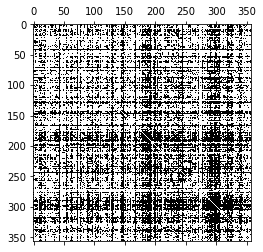

In [5]:
print_adj(adjacency)

/opt/anaconda3/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:579: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if not cb.iterable(width):


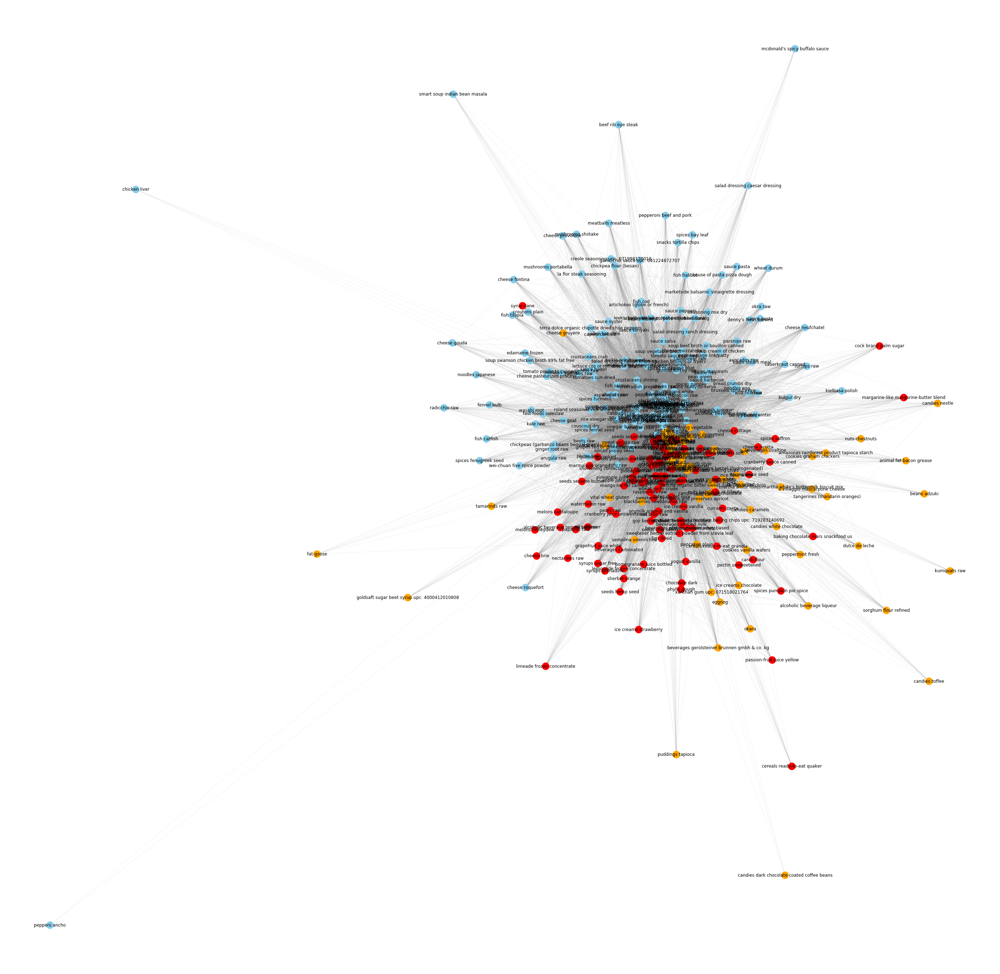

In [6]:
draw_graph_partitions(adjacency, all_ingredients, label_length=2, save='../graphics/ingredient_graph_2words')

### Ingredients linked by their nutritional properties

The graph below shows the ingredients linked by their nutritional information distance. 

For visualization purpose and to increase community detection, we try to sparsify the adjacency matrix even more. The graph is then disconnected (3 connected components).

After applying Louvain community detection algorithm, here are some observations (particularly on the sparsified graph):
- there's a big central cloud which seems to contain most complex ingredients
- all around this central component, clear communities seem to appear:
    1. sugars
    2. sauces
    3. spices (+ 2 small connected components)
    4. proteins: cheese, meat and fish
    5. oils and fat

(313, 313)
min 0.0 max 1.0


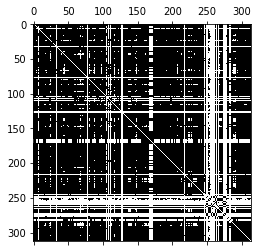

In [7]:
print_adj(adj_nutri_norm)

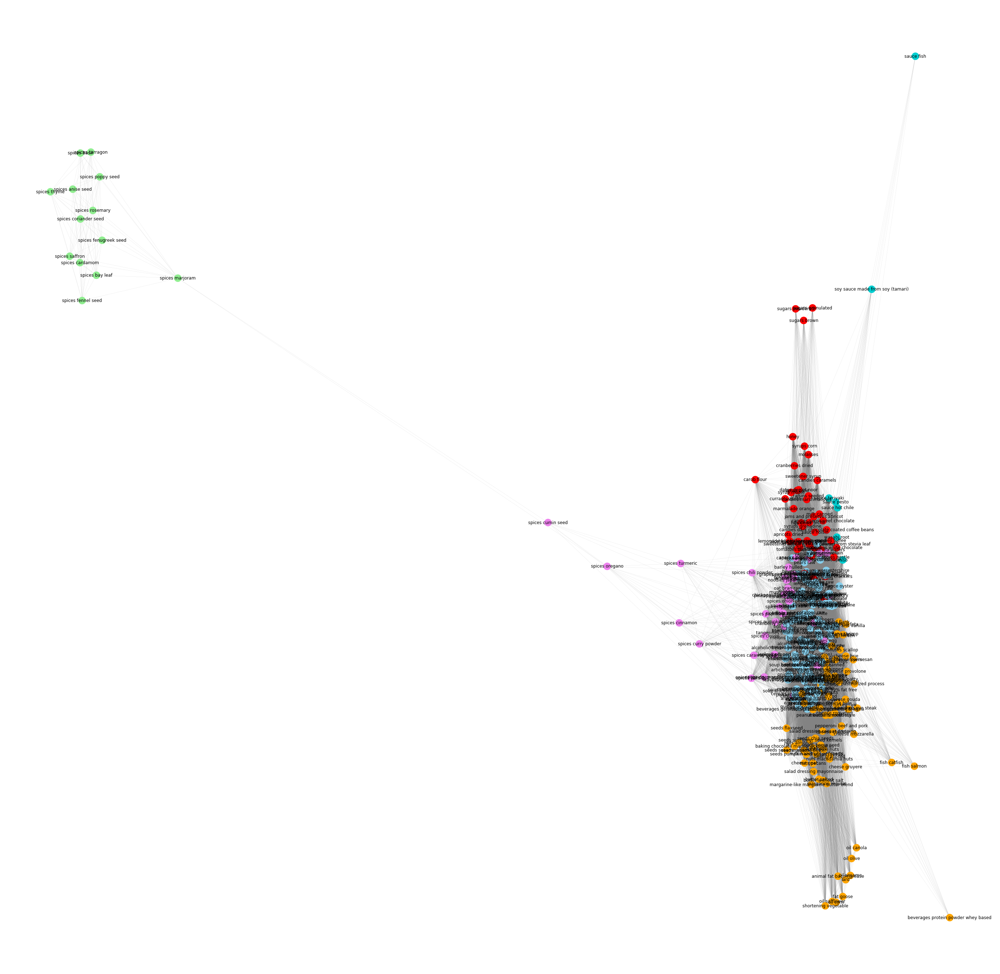

In [8]:
draw_graph_partitions(adj_nutri_norm, nutri_ingredients, label_length=2)

(313, 313)
min 0.0 max 1.0


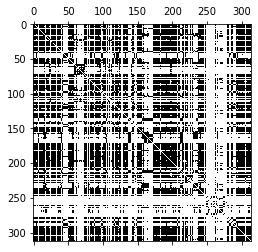

In [9]:
print_adj(adj_nutri_norm_sparsed)

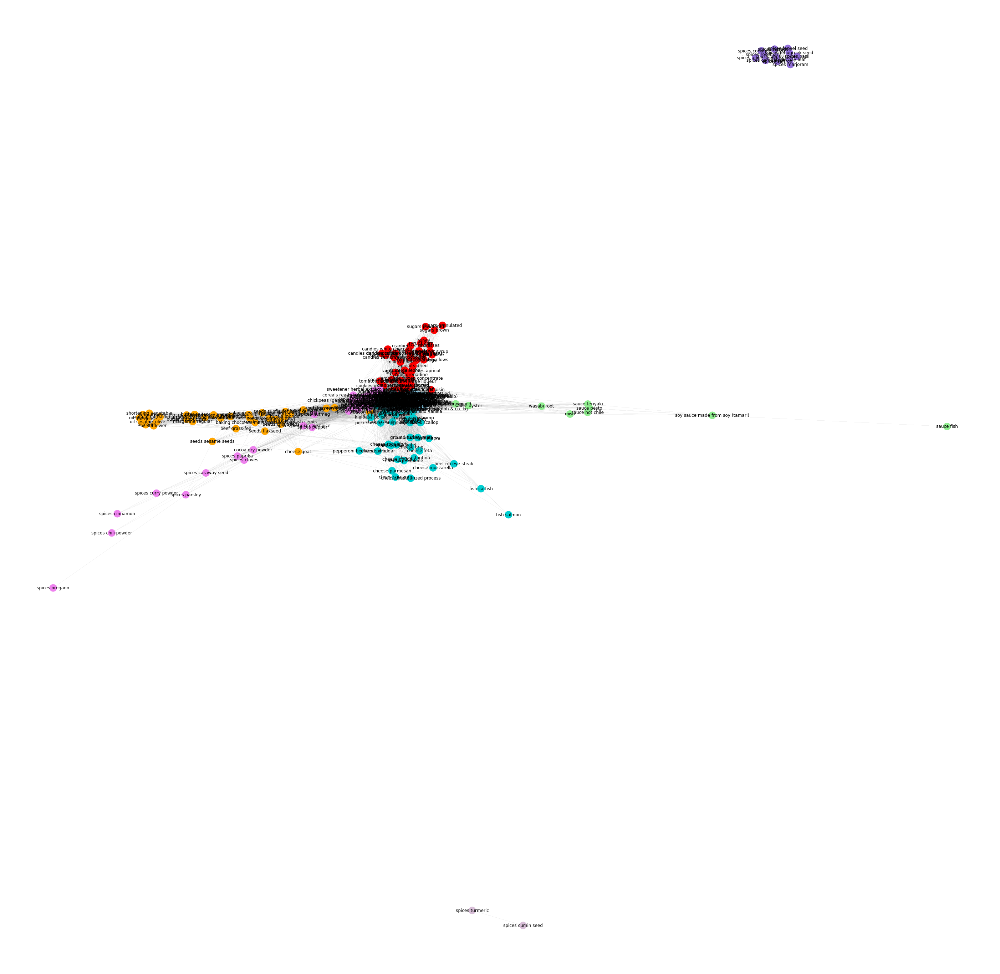

In [10]:
draw_graph_partitions(adj_nutri_norm_sparsed, nutri_ingredients, label_length=2, save='../graphics/nutri_sparsed_graph_2words')

### Ingredients linked by both nutritional information and common participation in recipes

As the results obtained with the "common participation in recipes" were not convincing, we tried with nutritional information only. The communities appearing were more defined and made more sense. However, we want to keep this similarity between ingredients using more than their nutritive information. We want to use the "compatibility" information contained in recipes ingredients lists.

Therefore we try to combine both adjacency matrices in a new one, using two methods
- multiplication: ingredients have to be close on both graphs
- addition: ingredients have to be close on both graphs, or really close on one of them

#### Addition

We observe almost the same communities as in the nutritional graph, but less defined.

Some communities have "merged":
- sweet and spices
- fish and cheese
- ...

(313, 313)
min 0.0 max 597.6062780374381


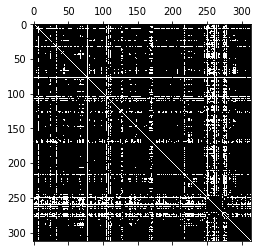

In [11]:
print_adj(adjacency_addition_mean)

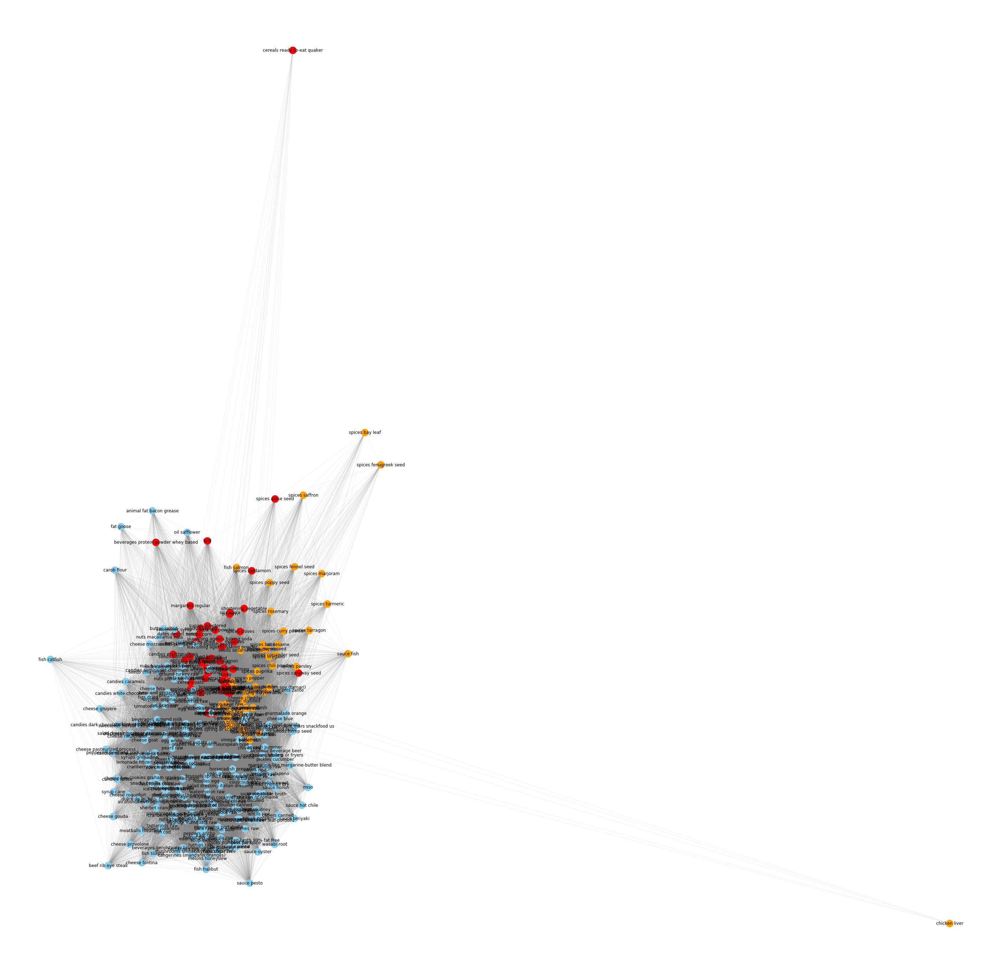

In [12]:
draw_graph_partitions(adjacency_addition_mean, nutri_ingredients, label_length=2, save='../graphics/add_combined_graph_2words')

#### Multiplication

No clear community seem to appear. However, we can observe small subcommunities: some spices that are grouped for example...
Having a closer look we can observe that communities like fat, sweet still kind of exist. New ones tend to appear like "beverages".

(313, 313)
min 0.0 max 0.38996781720913176


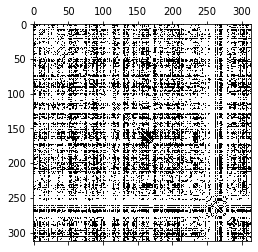

In [13]:
print_adj(adjacency_mult)

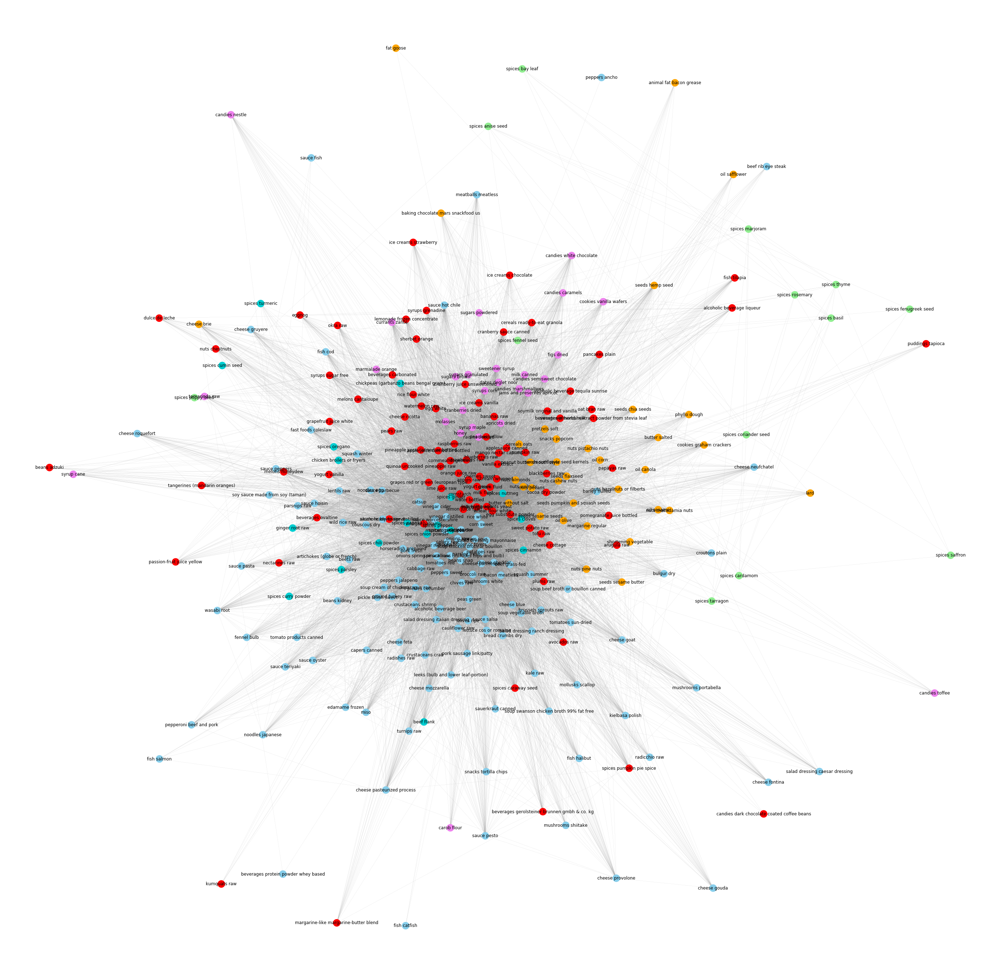

In [14]:
draw_graph_partitions(adjacency_mult, nutri_ingredients, label_length=2, save='../graphics/mul_combined_graph_2words')

## Conclusion

We observed three different graphs:
1. Ingredients linked by common participation in recipes
2. Ingredients linked by their nutritional info
3. Combination of 2 previous graphs

The graph (1) could be used to suggest new ingredients in a recipe, but it doesn't seem helpful to replace an ingredient by another. For the latter task, the graph (2) could do a great job. However, a similar ingredient on the nutritional aspect doesn't mean that it would fit well in the recipe. Therefore, we tried to combine the two graphs in a new one using both information.